In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import os

c:\Program Files\Python311\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


In [ ]:
df = pd.read_csv("../Car_Images_metadata_fixed.csv")

In [3]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.7
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.7
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,77.7
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,77.7
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.7


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3533 entries, 0 to 3532
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_path      3533 non-null   object 
 1   label           3533 non-null   int64  
 2   brand           3533 non-null   object 
 3   model           3533 non-null   object 
 4   year            3533 non-null   int64  
 5   filename        3533 non-null   object 
 6   L_real_m        3533 non-null   float64
 7   W_real_m        3533 non-null   float64
 8   H_real_m        3533 non-null   float64
 9   WB_real_m       3533 non-null   float64
 10  Noise_Level_dB  3533 non-null   float64
dtypes: float64(5), int64(2), object(4)
memory usage: 303.7+ KB


In [5]:
df = df.dropna()

In [6]:
df.shape

(3533, 11)

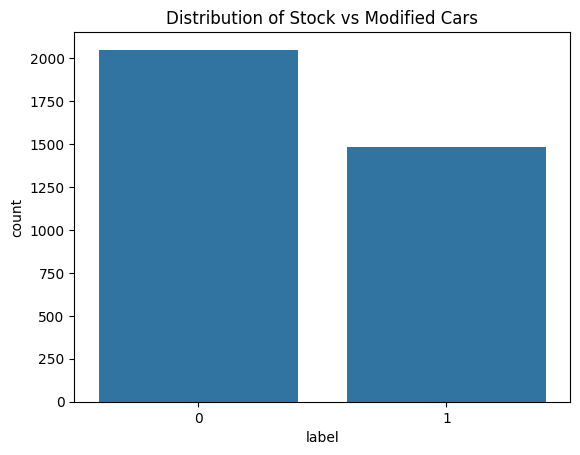

In [7]:
sns.countplot(x='label', data=df)
plt.title('Distribution of Stock vs Modified Cars')
plt.show()

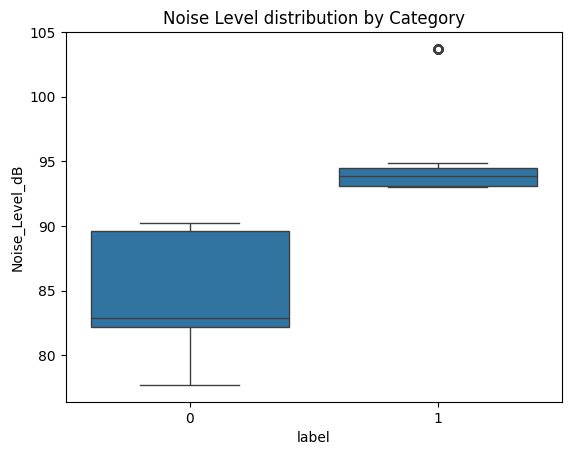

In [8]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

In [9]:
# Check the range overlap
print("Stock Range:", df[df['label']==0]['Noise_Level_dB'].min(), "-", df[df['label']==0]['Noise_Level_dB'].max())
print("Modified Range:", df[df['label']==1]['Noise_Level_dB'].min(), "-", df[df['label']==1]['Noise_Level_dB'].max())

Stock Range: 77.7 - 90.2
Modified Range: 93.0 - 103.7


In [ ]:
np.random.seed(42)

stock_lookup = df[df['label'] == 0].groupby(['brand', 'model'])['Noise_Level_dB'].mean().to_dict()

def force_overlap(row):
    base_db = stock_lookup.get((row['brand'], row['model']), row['Noise_Level_dB'])
    
    if row['label'] == 1:
        if np.random.rand() < 0.5:
            return base_db + np.random.normal(0, 0.5)
        else:
            return base_db + np.random.uniform(2, 8)
    return base_db + np.random.normal(0, 0.5)

df['Noise_Level_dB'] = df.apply(force_overlap, axis=1)

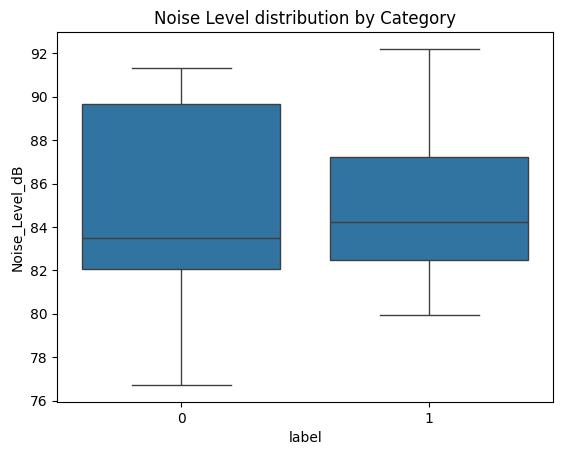

In [11]:
sns.boxplot(x='label', y='Noise_Level_dB', data=df)
plt.title('Noise Level distribution by Category')
plt.show()

In [12]:
# Check the range overlap
print("Stock Range:", df[df['label']==0]['Noise_Level_dB'].min(), "-", df[df['label']==0]['Noise_Level_dB'].max())
print("Modified Range:", df[df['label']==1]['Noise_Level_dB'].min(), "-", df[df['label']==1]['Noise_Level_dB'].max())

Stock Range: 76.72016493806011 - 91.31711102182499
Modified Range: 79.92952257777014 - 92.20275969155503


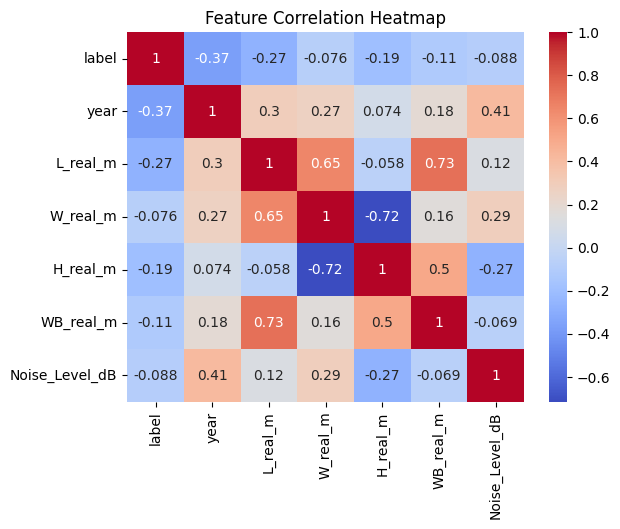

In [13]:
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

In [14]:
df.head()

,image_path,label,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.948357
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.630868
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,78.023844
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,78.461515
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,0,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.582923


In [28]:
X = df.drop("label", axis=1)
Y = df['label']

In [29]:
X.head()


,image_path,brand,model,year,filename,L_real_m,W_real_m,H_real_m,WB_real_m,Noise_Level_dB
0,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816756457.jpeg,4.5,1.8,1.4,2.7,77.948357
1,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816770582.jpeg,4.5,1.8,1.4,2.7,77.630868
2,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816784068.jpeg,4.5,1.8,1.4,2.7,78.023844
3,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816795763.jpeg,4.5,1.8,1.4,2.7,78.461515
4,Car_Images_Dataset/BMW/328i_2013/Stock/BMW_328...,BMW,328i,2013,BMW_328i_2013_Stock_1763816805646.jpeg,4.5,1.8,1.4,2.7,77.582923


In [30]:
Y.head()

0    0
1    0
2    0
3    0
4    0
Name: label, dtype: int64

In [32]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['brand', 'model']),
        ('num', StandardScaler(), ['year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB'])
    ])

In [37]:
# Optional: Handle imbalance
#smote = SMOTE(random_state=42)
#X_train, Y_train = smote.fit_resample(X_train, Y_train)

In [ ]:
base_dir = ".."

images = []
for path in df['image_path']:
    full_path = os.path.join(base_dir, path)
    img = cv2.imread(full_path)
    img = cv2.resize(img, (224, 224)) # Resize Image
    images.append(img)
images = np.array(images) / 255.0  # Normalize

In [ ]:
X_tab = df[['brand', 'model', 'year', 'L_real_m', 'W_real_m', 'H_real_m', 'WB_real_m', 'Noise_Level_dB']]

X_img = images

Y = df['label'].to_numpy()


In [ ]:
X_tab_train, X_tab_test, X_img_train, X_img_test, Y_train, Y_test = train_test_split(X_tab, X_img, Y,test_size=0.2,random_state=42,stratify=Y)


In [ ]:
X_tab_train = preprocessor.fit_transform(X_tab_train)
X_tab_test = preprocessor.transform(X_tab_test)

In [40]:
#Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)
datagen.fit(X_img_train)

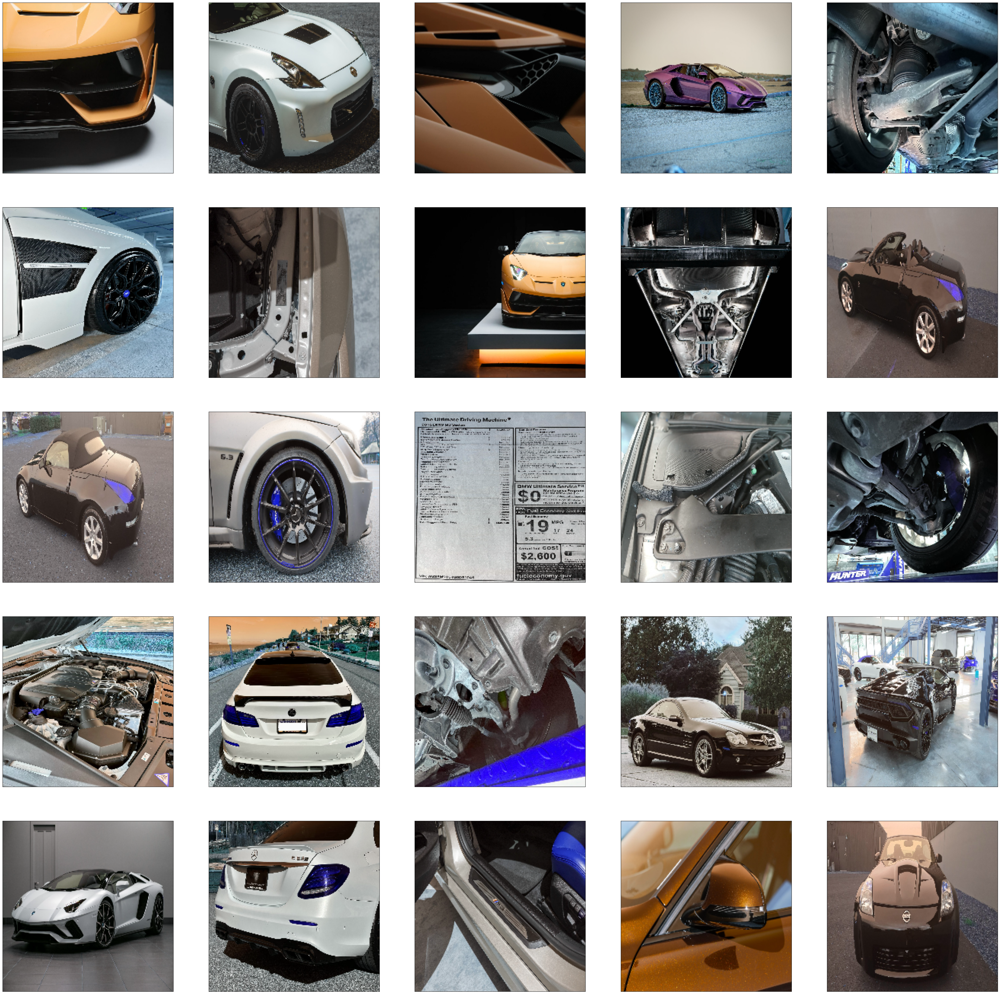

In [42]:
#some examples of the data
plt.figure(figsize=(50, 50))
for i in range(25):    
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_img_train[i], cmap=plt.cm.binary)  
plt.show()